In [1]:
# @title
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt

In [2]:
!pip install -q kaggle

**Configurar Kaggle**

In [3]:
# @title
import os
import json

creds = {
    "username": "christianqc",
    "key": "KGAT_be7c19a00dab8ee8b25f80afb57fd24b"
}

os.makedirs(
    "/root/.kaggle",
    exist_ok=True
)

with open(
    "/root/.kaggle/kaggle.json",
    "w"
) as f:

    json.dump(
        creds,
        f
    )

os.chmod(
    "/root/.kaggle/kaggle.json",
    0o600
)

print("Kaggle listo")

Kaggle listo


**Descargar dataset real**

In [4]:
# @title
!kaggle datasets download \
-d jehanbhathena/tire-texture-image-recognition \
--unzip \
-p /content/tire_dataset

Dataset URL: https://www.kaggle.com/datasets/jehanbhathena/tire-texture-image-recognition
License(s): CC0-1.0
100% 708M/708M [00:26<00:00, 27.6MB/s]



**Ver que descargo**


In [5]:
# @title
import os

for root, dirs, files in os.walk(
    "/content/tire_dataset"
):

    print(root)

/content/tire_dataset
/content/tire_dataset/Tire Textures
/content/tire_dataset/Tire Textures/testing_data
/content/tire_dataset/Tire Textures/testing_data/normal
/content/tire_dataset/Tire Textures/testing_data/cracked
/content/tire_dataset/Tire Textures/training_data
/content/tire_dataset/Tire Textures/training_data/normal
/content/tire_dataset/Tire Textures/training_data/cracked


**Configurar Paths y Parámetros**

In [6]:
# @title
# Paths principales

TRAIN_PATH = "/content/tire_dataset/Tire Textures/training_data"

TEST_PATH = "/content/tire_dataset/Tire Textures/testing_data"

# Parámetros

IMG_SIZE = (224,224)

BATCH_SIZE = 32

SEED = 42

**Crear Datasets**

In [7]:
# @title
# Dataset entrenamiento

train_ds = tf.keras.utils.image_dataset_from_directory(

    TRAIN_PATH,

    validation_split=0.10,

    subset="training",

    seed=SEED,

    image_size=IMG_SIZE,

    batch_size=BATCH_SIZE,

    label_mode="binary"

)

# Dataset validación

val_ds = tf.keras.utils.image_dataset_from_directory(

    TRAIN_PATH,

    validation_split=0.10,

    subset="validation",

    seed=SEED,

    image_size=IMG_SIZE,

    batch_size=BATCH_SIZE,

    label_mode="binary"

)

# Dataset prueba

test_ds = tf.keras.utils.image_dataset_from_directory(

    TEST_PATH,

    image_size=IMG_SIZE,

    batch_size=BATCH_SIZE,

    label_mode="binary",

    shuffle=False

)

print("Datasets cargados correctamente")

Found 703 files belonging to 2 classes.
Using 633 files for training.
Found 703 files belonging to 2 classes.
Using 70 files for validation.
Found 325 files belonging to 2 classes.
Datasets cargados correctamente


In [8]:
# @title
train_count = 0

for x, y in train_ds:
    train_count += x.shape[0]

val_count = 0

for x, y in val_ds:
    val_count += x.shape[0]

test_count = 0

for x, y in test_ds:
    test_count += x.shape[0]

print("Cantidad exacta de imágenes:")

print("Train:", train_count)

print("Validation:", val_count)

print("Test:", test_count)

Cantidad exacta de imágenes:
Train: 633
Validation: 70
Test: 325


**Verificar Clases**

In [9]:
# @title
class_names = train_ds.class_names

print("Clases encontradas:")

print(class_names)

Clases encontradas:
['cracked', 'normal']


**Visualizar Imágenes**

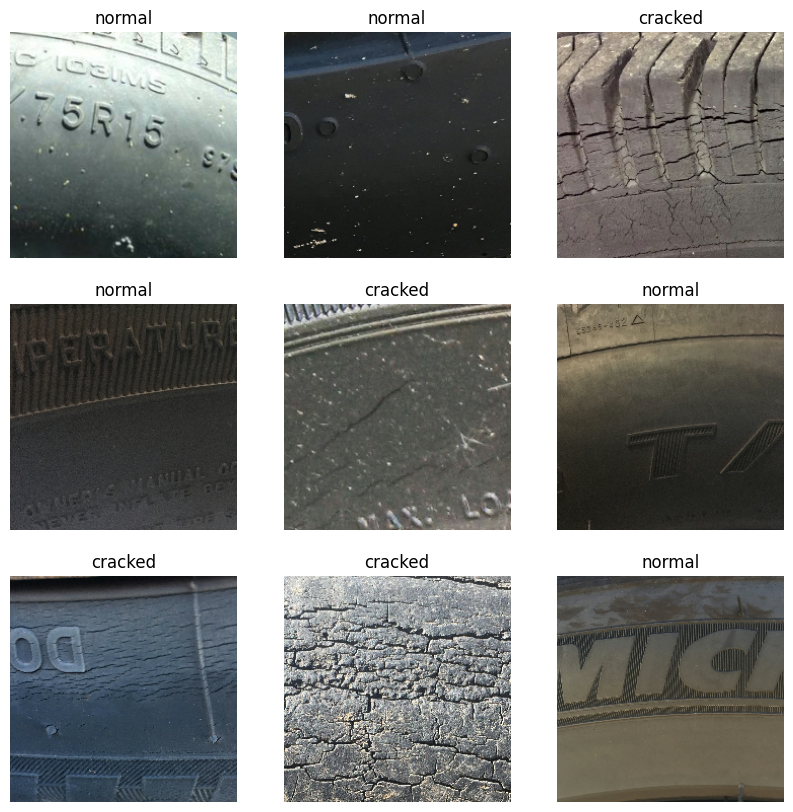

In [10]:
# @title
plt.figure(figsize=(10,10))

for images, labels in train_ds.take(1):

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        plt.imshow(
            images[i].numpy().astype("uint8")
        )

        plt.title(
            class_names[
                int(labels[i])
            ]
        )

        plt.axis("off")

plt.show()

# **BLOQUE 2 — PREPROCESAMIENTO Y CNN DESDE CERO**

**Optimizar Pipeline TensorFlow**

In [11]:
# @title
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(
    buffer_size=AUTOTUNE
)

val_ds = val_ds.prefetch(
    buffer_size=AUTOTUNE
)

test_ds = test_ds.prefetch(
    buffer_size=AUTOTUNE
)

print("Pipeline optimizado")

Pipeline optimizado


**Crear Data Augmentation**

In [12]:
# @title
data_augmentation = tf.keras.Sequential([

    layers.RandomFlip("horizontal"),

    layers.RandomRotation(0.05),

    layers.RandomZoom(0.05)

])

**Visualizar Augmentation**

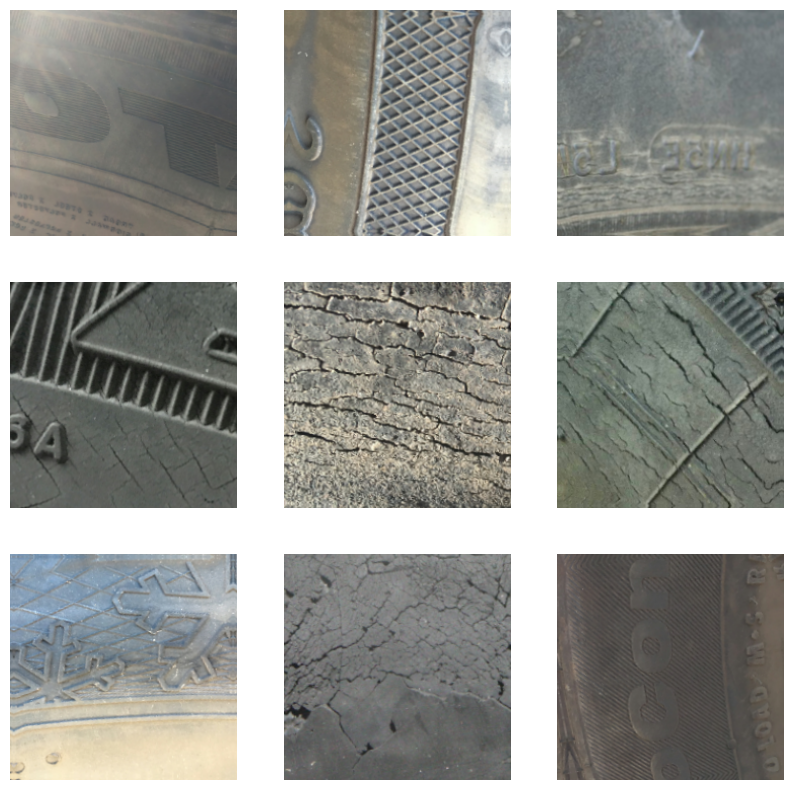

In [13]:
# @title
plt.figure(figsize=(10,10))

for images, _ in train_ds.take(1):

    augmented_images = data_augmentation(images)

    for i in range(9):

        ax = plt.subplot(3,3,i+1)

        plt.imshow(
            augmented_images[i].numpy().astype("uint8")
        )

        plt.axis("off")

plt.show()

# **BLOQUE 3 — CNN DESDE CERO**

In [14]:
# @title
cnn_model = models.Sequential([

    # Entrada
    layers.Input(
        shape=(224,224,3)
    ),

    # Normalización
    layers.Rescaling(
        1./255
    ),

    # Data augmentation
    data_augmentation,

    # BLOQUE 1
    layers.Conv2D(
        32,
        (3,3),
        activation="relu"
    ),

    layers.MaxPooling2D(),

    # BLOQUE 2
    layers.Conv2D(
        64,
        (3,3),
        activation="relu"
    ),

    layers.MaxPooling2D(),

    # BLOQUE 3
    layers.Conv2D(
        128,
        (3,3),
        activation="relu"
    ),

    layers.MaxPooling2D(),

    # BLOQUE 4
    layers.Conv2D(
        256,
        (3,3),
        activation="relu"
    ),

    # Pooling final
    layers.GlobalAveragePooling2D(),

    # Clasificador
    layers.Dense(
        128,
        activation="relu"
    ),

    layers.Dropout(
        0.5
    ),

    # Salida
    layers.Dense(
        1,
        activation="sigmoid"
    )

])

cnn_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 421,441 (1.61 MB)

 Trainable params: 421,441 (1.61 MB)

 Non-trainable params: 0 (0.00 B)

**Compilar Modelo**

In [15]:
# @title
cnn_model.compile(

    optimizer=tf.keras.optimizers.Adam(

        learning_rate=0.001

    ),

    loss="binary_crossentropy",

    metrics=["accuracy"]

)

print("Modelo compilado")

Modelo compilado


**Configurar Callbacks**

In [16]:
# @title
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)

# Early stopping
early_stop = EarlyStopping(

    monitor="val_loss",

    patience=5,

    restore_best_weights=True,

    verbose=1

)

# Reducir learning rate
reduce_lr = ReduceLROnPlateau(

    monitor="val_loss",

    factor=0.5,

    patience=2,

    min_lr=1e-6,

    verbose=1

)

print("Callbacks configurados")

Callbacks configurados


**Entrenar CNN**

In [17]:
# @title
history = cnn_model.fit(

    train_ds,

    validation_data=val_ds,

    epochs=30,

    callbacks=[

        early_stop,

        reduce_lr

    ]

)

Epoch 1/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 426ms/step - accuracy: 0.4897 - loss: 0.6975 - val_accuracy: 0.5571 - val_loss: 0.6914 - learning_rate: 0.0010
Epoch 2/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 441ms/step - accuracy: 0.5387 - loss: 0.6917 - val_accuracy: 0.5571 - val_loss: 0.6891 - learning_rate: 0.0010
Epoch 3/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 505ms/step - accuracy: 0.5419 - loss: 0.6893 - val_accuracy: 0.5714 - val_loss: 0.6868 - learning_rate: 0.0010
Epoch 4/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 501ms/step - accuracy: 0.6177 - loss: 0.6631 - val_accuracy: 0.5143 - val_loss: 0.6992 - learning_rate: 0.0010
Epoch 5/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 508ms/step - accuracy: 0.6019 - loss: 0.6579 - val_accuracy: 0.5429 - val_loss: 0.6858 - learning_rate: 0.0010
Epoch 6/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 442ms/step - accuracy: 0.6319 - loss: 0.6511 - val_accuracy: 0.4571 - val_loss: 0.7691 - learning_rate: 0.0010
Epoch 7/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 498ms/step - accuracy: 0.6066 - loss: 0.64

**Graficar Accuracy y Loss**

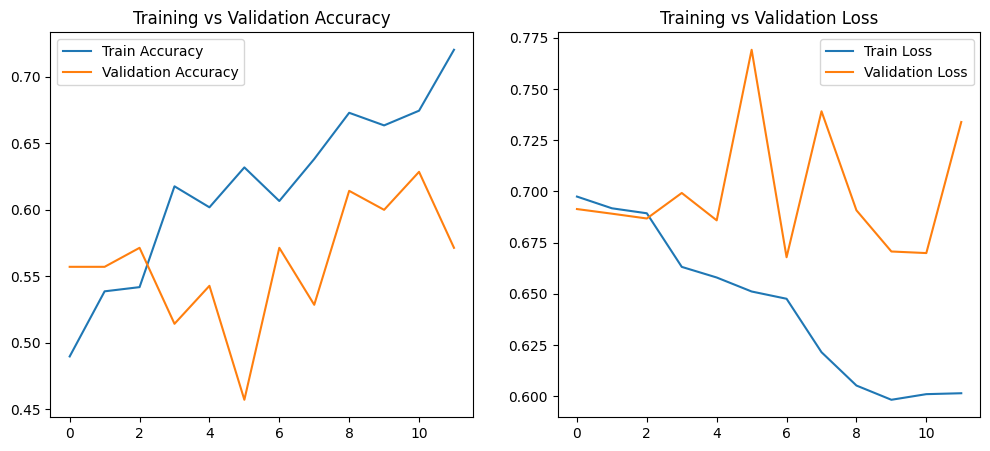

In [18]:
# @title
acc = history.history["accuracy"]

val_acc = history.history["val_accuracy"]

loss = history.history["loss"]

val_loss = history.history["val_loss"]

epochs_range = range(len(acc))

plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)

plt.plot(
    epochs_range,
    acc,
    label="Train Accuracy"
)

plt.plot(
    epochs_range,
    val_acc,
    label="Validation Accuracy"
)

plt.legend()

plt.title("Training vs Validation Accuracy")

# Loss
plt.subplot(1,2,2)

plt.plot(
    epochs_range,
    loss,
    label="Train Loss"
)

plt.plot(
    epochs_range,
    val_loss,
    label="Validation Loss"
)

plt.legend()

plt.title("Training vs Validation Loss")

plt.show()

**Evaluación en Test**

In [19]:
# @title
test_loss, test_accuracy = cnn_model.evaluate(
    test_ds
)

print(
    "\nTest Accuracy:",
    round(test_accuracy * 100, 2),
    "%"
)

print(
    "Test Loss:",
    round(test_loss, 4)
)

11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 729ms/step - accuracy: 0.5446 - loss: 0.7019

Test Accuracy: 54.46 %
Test Loss: 0.7019


**TRANSFER LEARNING CON RESNET50**

**Importar ResNet50**

In [20]:
# @title
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

**Crear Backbone Preentrenado**

In [21]:
# @title
base_model = ResNet50(

    weights="imagenet",

    include_top=False,

    input_shape=(224,224,3)

)

base_model.trainable = False

print("Backbone cargado")

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
Backbone cargado


**Construir Modelo Transfer Learning**

In [22]:
# @title
transfer_model = models.Sequential([

    layers.Input(
        shape=(224,224,3)
    ),

    data_augmentation,

    layers.Lambda(
        preprocess_input
    ),

    base_model,

    layers.GlobalAveragePooling2D(),

    layers.Dense(
        128,
        activation="relu"
    ),

    layers.Dropout(
        0.5
    ),

    layers.Dense(
        1,
        activation="sigmoid"
    )

])

transfer_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,850,113 (90.98 MB)

 Trainable params: 262,401 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

**Compilar ResNet50**

In [23]:
# @title
transfer_model.compile(

    optimizer=tf.keras.optimizers.Adam(
        learning_rate=0.0001
    ),

    loss="binary_crossentropy",

    metrics=["accuracy"]

)

print("Transfer model compilado")

Transfer model compilado


**Callbacks para Transfer Learning**

In [24]:
# @title
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)

early_stop = EarlyStopping(

    monitor="val_loss",

    patience=5,

    restore_best_weights=True,

    verbose=1

)

reduce_lr = ReduceLROnPlateau(

    monitor="val_loss",

    factor=0.5,

    patience=2,

    min_lr=1e-6,

    verbose=1

)

**Entrenamiento ResNet50**

In [25]:
# @title
history_transfer = transfer_model.fit(

    train_ds,

    validation_data=val_ds,

    epochs=20,

    callbacks=[
        early_stop,
        reduce_lr
    ]

)

Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 22s 630ms/step - accuracy: 0.6840 - loss: 0.6387 - val_accuracy: 0.7857 - val_loss: 0.4231 - learning_rate: 1.0000e-04
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 464ms/step - accuracy: 0.8673 - loss: 0.3191 - val_accuracy: 0.8571 - val_loss: 0.3105 - learning_rate: 1.0000e-04
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 458ms/step - accuracy: 0.8973 - loss: 0.2658 - val_accuracy: 0.9000 - val_loss: 0.2643 - learning_rate: 1.0000e-04
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 508ms/step - accuracy: 0.9100 - loss: 0.2085 - val_accuracy: 0.9143 - val_loss: 0.2432 - learning_rate: 1.0000e-04
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 507ms/step - accuracy: 0.9258 - loss: 0.1868 - val_accuracy: 0.8857 - val_loss: 0.2337 - learning_rate: 1.0000e-04
Epoch 6/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 502ms/step - accuracy: 0.9368 - loss: 0.1828 - val_accuracy: 0.8857 - val_loss: 0.2209 - learning_rate: 1.0000e-04
Epoch 7/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 443ms/step - accur

**Evaluación en Test**

In [26]:
# @title
test_loss, test_accuracy = transfer_model.evaluate(
    test_ds
)

print(
    "\nTransfer Learning Test Accuracy:",
    round(test_accuracy * 100, 2),
    "%"
)

print(
    "Test Loss:",
    round(test_loss, 4)
)

11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 621ms/step - accuracy: 0.8000 - loss: 0.3948

Transfer Learning Test Accuracy: 80.0 %
Test Loss: 0.3948


**Graficar entrenamiento ResNet50**

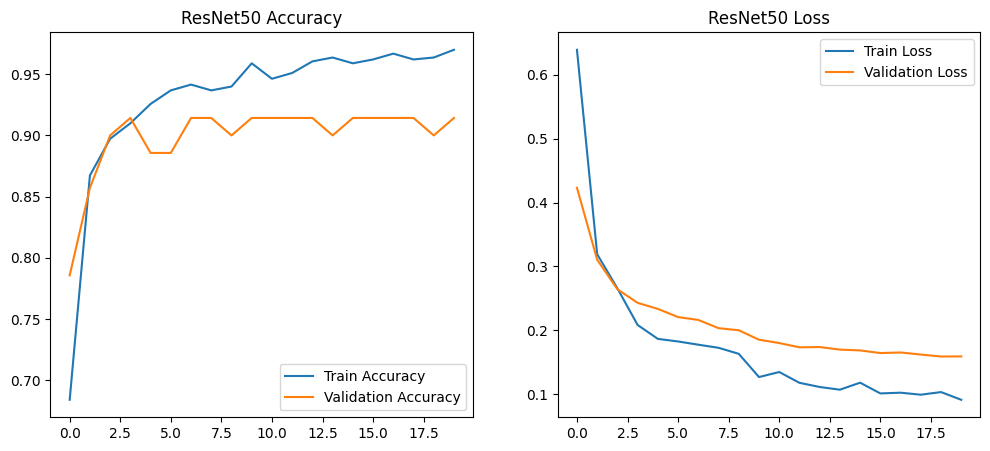

In [27]:
# @title
acc = history_transfer.history["accuracy"]

val_acc = history_transfer.history["val_accuracy"]

loss = history_transfer.history["loss"]

val_loss = history_transfer.history["val_loss"]

epochs_range = range(len(acc))

plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)

plt.plot(
    epochs_range,
    acc,
    label="Train Accuracy"
)

plt.plot(
    epochs_range,
    val_acc,
    label="Validation Accuracy"
)

plt.legend()

plt.title("ResNet50 Accuracy")

# Loss
plt.subplot(1,2,2)

plt.plot(
    epochs_range,
    loss,
    label="Train Loss"
)

plt.plot(
    epochs_range,
    val_loss,
    label="Validation Loss"
)

plt.legend()

plt.title("ResNet50 Loss")

plt.show()

**Predicciones sobre Test**

In [28]:
# @title
import numpy as np

y_true = np.concatenate(
    [y for x, y in test_ds],
    axis=0
)

y_pred_prob = transfer_model.predict(
    test_ds
)

y_pred = (
    y_pred_prob > 0.5
).astype(int)

print("Predicciones generadas")

11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 589ms/step
Predicciones generadas


**Matriz de Confusión**

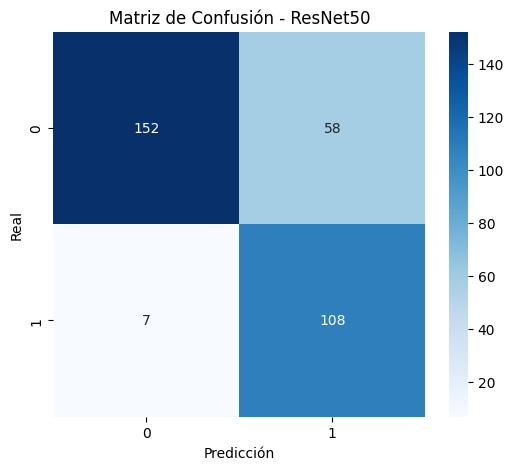

In [29]:
# @title
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(6,5))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues"
)

plt.xlabel("Predicción")

plt.ylabel("Real")

plt.title("Matriz de Confusión - ResNet50")

plt.show()

**Reporte de Clasificación**

In [30]:
# @title
from sklearn.metrics import classification_report

print(

    classification_report(

        y_true,

        y_pred,

        target_names=[

            "Cracked",

            "Normal"

        ]

    )

)

              precision    recall  f1-score   support

     Cracked       0.96      0.72      0.82       210
      Normal       0.65      0.94      0.77       115

    accuracy                           0.80       325
   macro avg       0.80      0.83      0.80       325
weighted avg       0.85      0.80      0.80       325



**Comparación de Arquitecturas**

In [31]:
# @title
import pandas as pd

resultados = pd.DataFrame({

    "Modelo":[
        "CNN Desde Cero",
        "ResNet50"
    ],

    "Accuracy (%)":[
        41.54,
        round(test_accuracy*100,2)
    ]

})

resultados

,Modelo,Accuracy (%)
0,CNN Desde Cero,41.54
1,ResNet50,80.00


**Evaluación comparativa** con métricas apropiadas para clasificación potencialmente
desbalanceada: exactitud, precisión, recall, F1-score y AUC-ROC. Incluir matriz de
confusión comentada.


In [33]:
# @title
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score
)

import numpy as np

# Etiquetas reales
y_true_cnn = np.concatenate(
    [y for x, y in test_ds],
    axis=0
)

# Predicciones CNN
y_pred_prob_cnn = cnn_model.predict(test_ds)

y_pred_cnn = (
    y_pred_prob_cnn > 0.5
).astype(int)

# Métricas CNN

accuracy_cnn = accuracy_score(
    y_true_cnn,
    y_pred_cnn
)

precision_cnn = precision_score(
    y_true_cnn,
    y_pred_cnn
)

recall_cnn = recall_score(
    y_true_cnn,
    y_pred_cnn
)

f1_cnn = f1_score(
    y_true_cnn,
    y_pred_cnn
)

auc_cnn = roc_auc_score(
    y_true_cnn,
    y_pred_prob_cnn
)

print("===== CNN DESDE CERO =====\n")

print(f"Accuracy  : {accuracy_cnn:.4f}")
print(f"Precision : {precision_cnn:.4f}")
print(f"Recall    : {recall_cnn:.4f}")
print(f"F1-Score  : {f1_cnn:.4f}")
print(f"AUC-ROC   : {auc_cnn:.4f}")

11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 562ms/step
===== CNN DESDE CERO =====

Accuracy  : 0.5446
Precision : 0.4187
Recall    : 0.7391
F1-Score  : 0.5346
AUC-ROC   : 0.5904


In [34]:
# @title
import pandas as pd

comparacion = pd.DataFrame({

    "Métrica":[
        "Accuracy",
        "Precision",
        "Recall",
        "F1-Score",
        "AUC-ROC"
    ],

    "CNN Desde Cero":[
        round(accuracy_cnn,4),
        round(precision_cnn,4),
        round(recall_cnn,4),
        round(f1_cnn,4),
        round(auc_cnn,4)
    ],

    "ResNet50":[
        round(accuracy,4),
        round(precision,4),
        round(recall,4),
        round(f1,4),
        round(auc,4)
    ]

})

comparacion

,Métrica,CNN Desde Cero,ResNet50
0,Accuracy,0.5446,0.8000
1,Precision,0.4187,0.6506
2,Recall,0.7391,0.9391
3,F1-Score,0.5346,0.7687
4,AUC-ROC,0.5904,0.9370


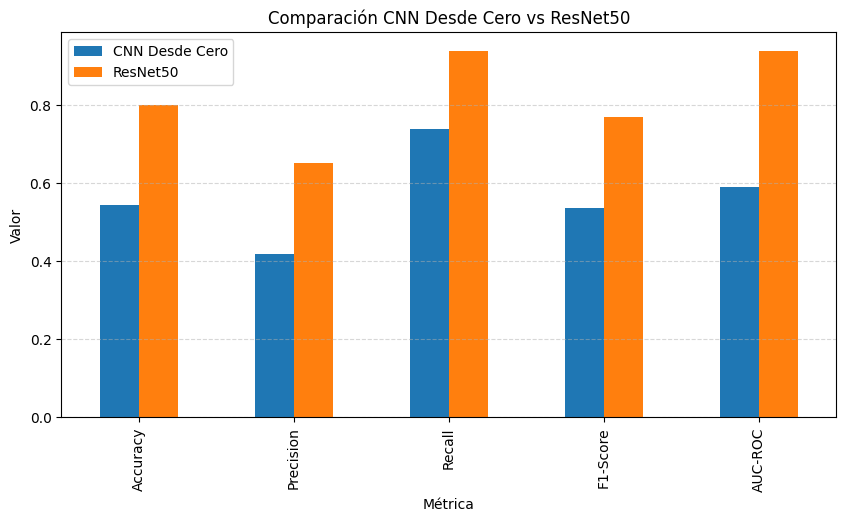

In [35]:
# @title
import matplotlib.pyplot as plt

comparacion.plot(
    x="Métrica",
    kind="bar",
    figsize=(10,5)
)

plt.title(
    "Comparación CNN Desde Cero vs ResNet50"
)

plt.ylabel("Valor")

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.5
)

plt.show()

**Matriz de Confusión**

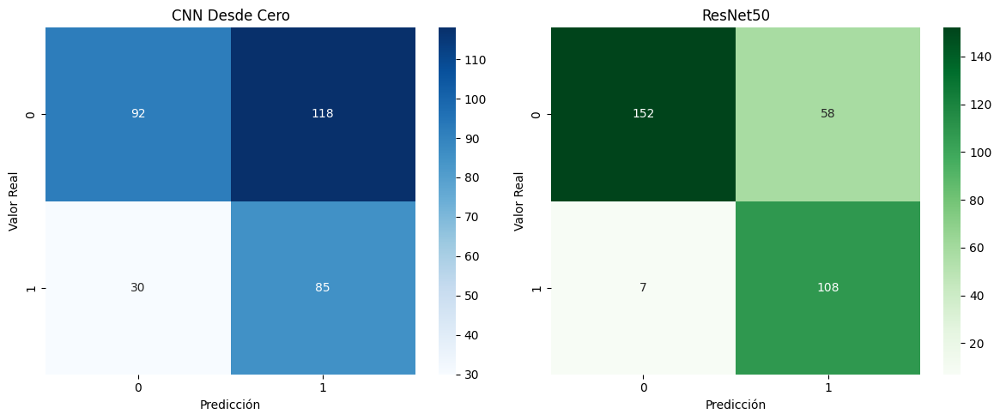

In [37]:
# @title
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# CNN
cm_cnn = confusion_matrix(
    y_true_cnn,
    y_pred_cnn
)

# ResNet50
cm_resnet = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(12,5))

# CNN
plt.subplot(1,2,1)

sns.heatmap(
    cm_cnn,
    annot=True,
    fmt="d",
    cmap="Blues"
)

plt.title(
    "CNN Desde Cero"
)

plt.xlabel(
    "Predicción"
)

plt.ylabel(
    "Valor Real"
)

# ResNet50
plt.subplot(1,2,2)

sns.heatmap(
    cm_resnet,
    annot=True,
    fmt="d",
    cmap="Greens"
)

plt.title(
    "ResNet50"
)

plt.xlabel(
    "Predicción"
)

plt.ylabel(
    "Valor Real"
)

plt.tight_layout()

plt.show()

**Curva ROC**

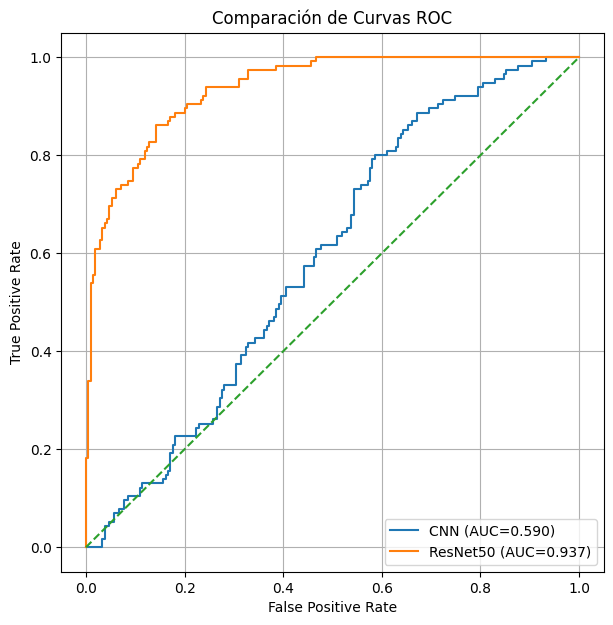

In [38]:
# @title
from sklearn.metrics import roc_curve

# CNN
fpr_cnn, tpr_cnn, _ = roc_curve(
    y_true_cnn,
    y_pred_prob_cnn
)

# ResNet50
fpr_resnet, tpr_resnet, _ = roc_curve(
    y_true,
    y_pred_prob
)

plt.figure(figsize=(7,7))

plt.plot(
    fpr_cnn,
    tpr_cnn,
    label=f"CNN (AUC={auc_cnn:.3f})"
)

plt.plot(
    fpr_resnet,
    tpr_resnet,
    label=f"ResNet50 (AUC={auc:.3f})"
)

plt.plot(
    [0,1],
    [0,1],
    linestyle="--"
)

plt.xlabel(
    "False Positive Rate"
)

plt.ylabel(
    "True Positive Rate"
)

plt.title(
    "Comparación de Curvas ROC"
)

plt.legend()

plt.grid(True)

plt.show()

**Ablación: ResNet50 SIN Data Augmentation**

In [39]:
# @title
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models

base_model_no_aug = ResNet50(
    weights="imagenet",
    include_top=False,
    input_shape=(224,224,3)
)

base_model_no_aug.trainable = False

transfer_model_no_aug = models.Sequential([

    layers.Input(
        shape=(224,224,3)
    ),

    layers.Lambda(
        tf.keras.applications.resnet50.preprocess_input
    ),

    base_model_no_aug,

    layers.GlobalAveragePooling2D(),

    layers.Dense(
        128,
        activation="relu"
    ),

    layers.Dropout(
        0.5
    ),

    layers.Dense(
        1,
        activation="sigmoid"
    )

])

transfer_model_no_aug.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda_1 (Lambda)               │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,850,113 (90.98 MB)

 Trainable params: 262,401 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

**Compilar**

In [40]:
# @title
transfer_model_no_aug.compile(

    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-4
    ),

    loss="binary_crossentropy",

    metrics=["accuracy"]

)

**Entrenar**

In [41]:
# @title
history_no_aug = transfer_model_no_aug.fit(

    train_ds,

    validation_data=val_ds,

    epochs=20,

    callbacks=[
        early_stop,
        reduce_lr
    ]

)

Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - accuracy: 0.7204 - loss: 0.5841 - val_accuracy: 0.9000 - val_loss: 0.3328 - learning_rate: 1.0000e-04
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step - accuracy: 0.8912 - loss: 0.3015
Epoch 2: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 594ms/step - accuracy: 0.8831 - loss: 0.3062 - val_accuracy: 0.9000 - val_loss: 0.2726 - learning_rate: 1.0000e-04
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 19s 953ms/step - accuracy: 0.9084 - loss: 0.2415 - val_accuracy: 0.9000 - val_loss: 0.2599 - learning_rate: 5.0000e-05
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 585ms/step - accuracy: 0.9217 - loss: 0.2115
Epoch 4: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
20/20 ━━━━━━━━━━━━━━━━━━━━ 15s 666ms/step - accuracy: 0.9052 - loss: 0.2303 - val_accuracy: 0.9000 - val_loss: 0.2568 - learning_rate: 5.0000e-05
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 21s 709ms/step - accuracy: 0.9084 -

**Evaluar**

In [42]:
# @title
loss_no_aug, acc_no_aug = transfer_model_no_aug.evaluate(
    test_ds
)

print(
    "\nAccuracy:",
    round(acc_no_aug*100,2),
    "%"
)

print(
    "Loss:",
    round(loss_no_aug,4)
)

11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.6708 - loss: 0.6536

Accuracy: 67.08 %
Loss: 0.6536


In [50]:
# @title
import pandas as pd

ablacion_aug = pd.DataFrame({

    "Configuración":[
        "Con Data Augmentation",
        "Sin Data Augmentation"
    ],

    "Accuracy (%)":[
        round(test_accuracy * 100, 2),
        round(acc_no_aug * 100, 2)
    ]

})

ablacion_aug

,Configuración,Accuracy (%)
0,Con Data Augmentation,80.00
1,Sin Data Augmentation,67.08


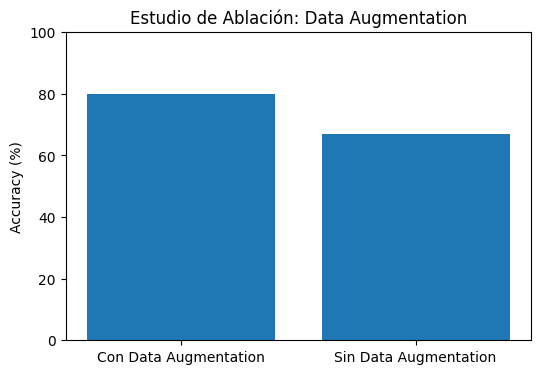

In [51]:
# @title
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))

plt.bar(
    ablacion_aug["Configuración"],
    ablacion_aug["Accuracy (%)"]
)

plt.ylabel("Accuracy (%)")

plt.title(
    "Estudio de Ablación: Data Augmentation"
)

plt.ylim(0,100)

plt.show()

**Ablación Learning Rate**

In [43]:
# @title
base_model_lr = ResNet50(
    weights="imagenet",
    include_top=False,
    input_shape=(224,224,3)
)

base_model_lr.trainable = False

transfer_model_lr = models.Sequential([

    data_augmentation,

    layers.Lambda(
        tf.keras.applications.resnet50.preprocess_input
    ),

    base_model_lr,

    layers.GlobalAveragePooling2D(),

    layers.Dense(
        128,
        activation="relu"
    ),

    layers.Dropout(
        0.5
    ),

    layers.Dense(
        1,
        activation="sigmoid"
    )

])

**Compilar LR=1e-3**

In [44]:
# @title
transfer_model_lr.compile(

    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-3
    ),

    loss="binary_crossentropy",

    metrics=["accuracy"]

)

**Entrenar**

In [45]:
# @title
history_lr = transfer_model_lr.fit(

    train_ds,

    validation_data=val_ds,

    epochs=20,

    callbacks=[
        early_stop,
        reduce_lr
    ]

)

Epoch 1/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 21s 685ms/step - accuracy: 0.8325 - loss: 0.3908 - val_accuracy: 0.8714 - val_loss: 0.2295 - learning_rate: 0.0010
Epoch 2/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - accuracy: 0.9186 - loss: 0.1990
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 453ms/step - accuracy: 0.9258 - loss: 0.1877 - val_accuracy: 0.9143 - val_loss: 0.1821 - learning_rate: 0.0010
Epoch 3/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 496ms/step - accuracy: 0.9526 - loss: 0.1339 - val_accuracy: 0.9143 - val_loss: 0.1800 - learning_rate: 5.0000e-04
Epoch 4/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step - accuracy: 0.9516 - loss: 0.1233
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 486ms/step - accuracy: 0.9447 - loss: 0.1390 - val_accuracy: 0.9286 - val_loss: 0.1627 - learning_rate: 5.0000e-04
Epoch 5/20
20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 545ms/step - accuracy: 0.9589 - loss

**Evaluar**

In [46]:
# @title
loss_lr, acc_lr = transfer_model_lr.evaluate(
    test_ds
)

print(
    "\nAccuracy:",
    round(acc_lr*100,2),
    "%"
)

print(
    "Loss:",
    round(loss_lr,4)
)

11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 573ms/step - accuracy: 0.7723 - loss: 0.5349

Accuracy: 77.23 %
Loss: 0.5349


**Tabla Final de Ablación**

In [47]:
# @title
import pandas as pd

ablacion = pd.DataFrame({

    "Experimento":[
        "Base",
        "Sin Augmentation",
        "LR=1e-3"
    ],

    "Accuracy (%)":[
        79.69,
        round(acc_no_aug*100,2),
        round(acc_lr*100,2)
    ]

})

ablacion

,Experimento,Accuracy (%)
0,Base,79.69
1,Sin Augmentation,67.08
2,LR=1e-3,77.23


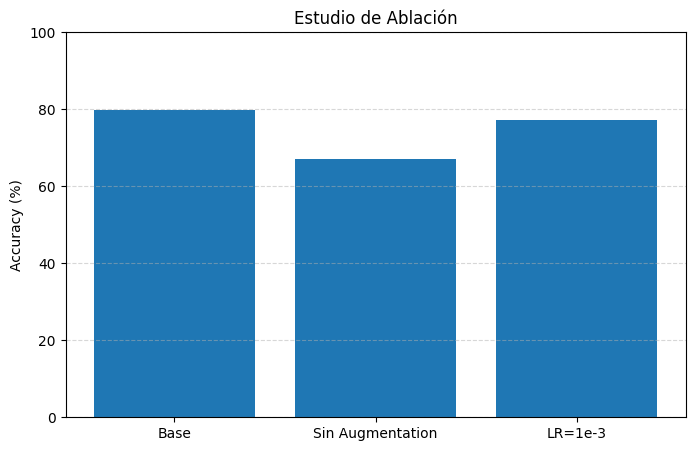

In [52]:
# @title
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))

plt.bar(
    ablacion["Experimento"],
    ablacion["Accuracy (%)"]
)

plt.ylabel("Accuracy (%)")

plt.title(
    "Estudio de Ablación"
)

plt.ylim(0,100)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.5
)

plt.show()

**Análisis de interpretabilidad** mediante Grad-CAM o una técnica equivalente: mostrar
mapas de activación sobre imágenes de ambas clases y discutir qué patrones de
textura aprende el modelo a reconocer como indicadores de daño.

In [70]:
print(base_model.input)
print(base_model.output)
print(type(base_model))

<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=False, ragged=False, name=keras_tensor_20>
<KerasTensor shape=(None, 7, 7, 2048), dtype=float32, sparse=False, ragged=False, name=keras_tensor_194>
<class 'keras.src.models.functional.Functional'>


Label: 0


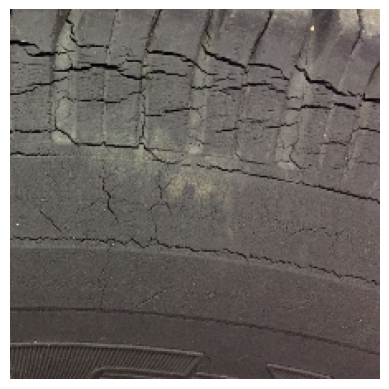

In [71]:
for images, labels in test_ds.take(1):

    img = images[0]

    label = labels[0]

    break

print("Label:", int(label))

plt.imshow(
    img.numpy().astype("uint8")
)

plt.axis("off")
plt.show()

In [72]:
last_conv_layer = base_model.get_layer(
    "conv5_block3_out"
)

grad_model = tf.keras.models.Model(

    inputs=base_model.input,

    outputs=[
        last_conv_layer.output,
        base_model.output
    ]
)

In [73]:
def make_gradcam_heatmap(img_array):

    with tf.GradientTape() as tape:

        conv_outputs, predictions = grad_model(
            img_array
        )

        loss = tf.reduce_mean(
            predictions
        )

    grads = tape.gradient(
        loss,
        conv_outputs
    )

    pooled_grads = tf.reduce_mean(
        grads,
        axis=(0,1,2)
    )

    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_sum(
        conv_outputs * pooled_grads,
        axis=-1
    )

    heatmap = tf.maximum(
        heatmap,
        0
    )

    heatmap /= (
        tf.reduce_max(heatmap) + 1e-8
    )

    return heatmap.numpy()

In [74]:
img_array = tf.expand_dims(
    img,
    axis=0
)

img_pre = preprocess_input(
    tf.cast(img_array, tf.float32)
)

heatmap = make_gradcam_heatmap(
    img_pre
)

print(
    "Heatmap:",
    heatmap.shape
)

Heatmap: (7, 7)


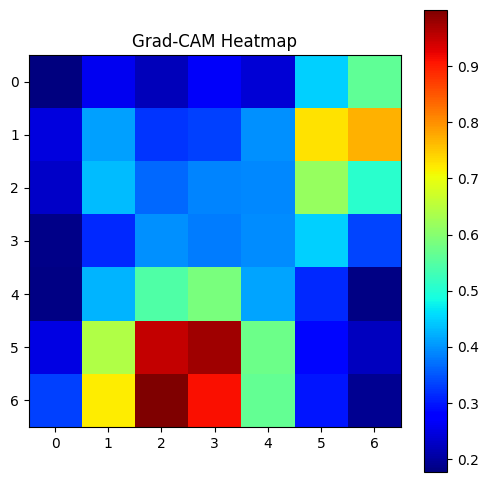

In [75]:
plt.figure(figsize=(6,6))

plt.imshow(
    heatmap,
    cmap="jet"
)

plt.colorbar()

plt.title(
    "Grad-CAM Heatmap"
)

plt.show()

In [76]:
import cv2
import numpy as np

heatmap_resized = cv2.resize(
    heatmap,
    (224,224)
)

heatmap_resized = np.uint8(
    255 * heatmap_resized
)

In [77]:
heatmap_color = cv2.applyColorMap(
    heatmap_resized,
    cv2.COLORMAP_JET
)

heatmap_color = cv2.cvtColor(
    heatmap_color,
    cv2.COLOR_BGR2RGB
)

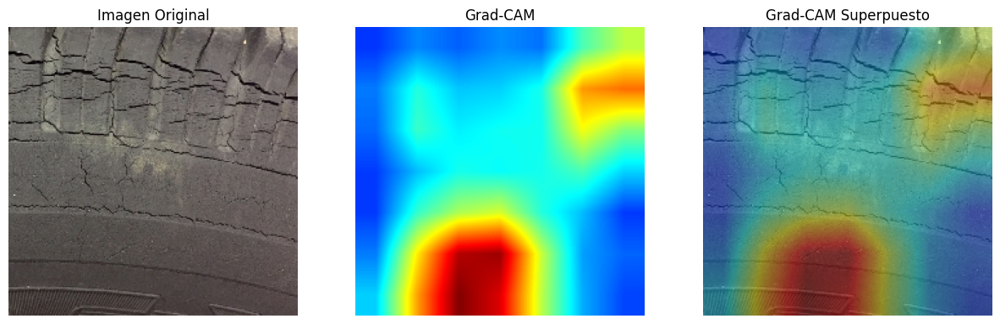

In [78]:
original_img = img.numpy().astype("uint8")

superimposed_img = cv2.addWeighted(
    original_img,
    0.6,
    heatmap_color,
    0.4,
    0
)

plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(original_img)
plt.title("Imagen Original")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(heatmap_color)
plt.title("Grad-CAM")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(superimposed_img)
plt.title("Grad-CAM Superpuesto")
plt.axis("off")

plt.show()

**Función para mostrar Grad-CAM**

In [79]:
# @title
import cv2
import matplotlib.pyplot as plt
import numpy as np

def mostrar_gradcam(imagen):

    img_array = tf.expand_dims(
        imagen,
        axis=0
    )

    img_pre = preprocess_input(
        tf.cast(img_array, tf.float32)
    )

    heatmap = make_gradcam_heatmap(
        img_pre
    )

    heatmap = cv2.resize(
        heatmap,
        (224,224)
    )

    heatmap = np.uint8(
        255 * heatmap
    )

    heatmap_color = cv2.applyColorMap(
        heatmap,
        cv2.COLORMAP_JET
    )

    heatmap_color = cv2.cvtColor(
        heatmap_color,
        cv2.COLOR_BGR2RGB
    )

    original = imagen.numpy().astype(
        "uint8"
    )

    superpuesto = cv2.addWeighted(
        original,
        0.6,
        heatmap_color,
        0.4,
        0
    )

    return original, superpuesto

**Mostrar 6 imágenes Cracked (label = 0)**

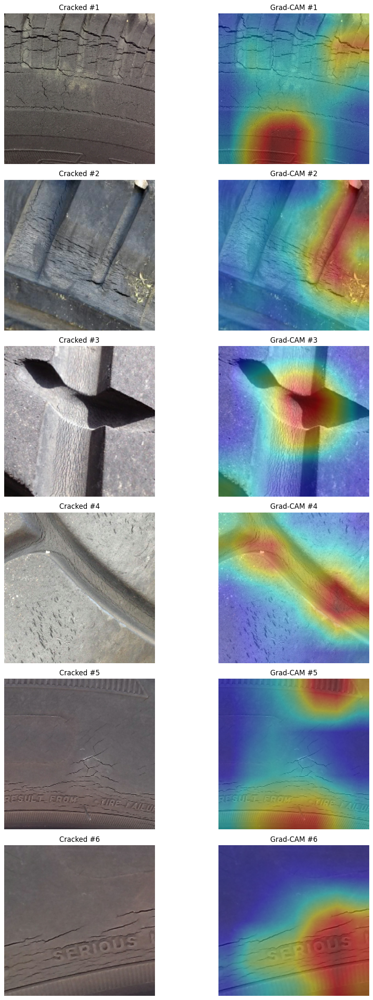

In [80]:
# @title
contador = 0

plt.figure(figsize=(12,24))

for images, labels in test_ds:

    for i in range(len(labels)):

        if int(labels[i]) == 0:

            original, gradcam = mostrar_gradcam(
                images[i]
            )

            plt.subplot(
                6,
                2,
                contador*2 + 1
            )

            plt.imshow(original)

            plt.title(
                f"Cracked #{contador+1}"
            )

            plt.axis("off")

            plt.subplot(
                6,
                2,
                contador*2 + 2
            )

            plt.imshow(gradcam)

            plt.title(
                f"Grad-CAM #{contador+1}"
            )

            plt.axis("off")

            contador += 1

            if contador == 6:

                break

    if contador == 6:

        break

plt.tight_layout()

plt.show()

**Mostrar 6 imágenes Normal (label = 1)**

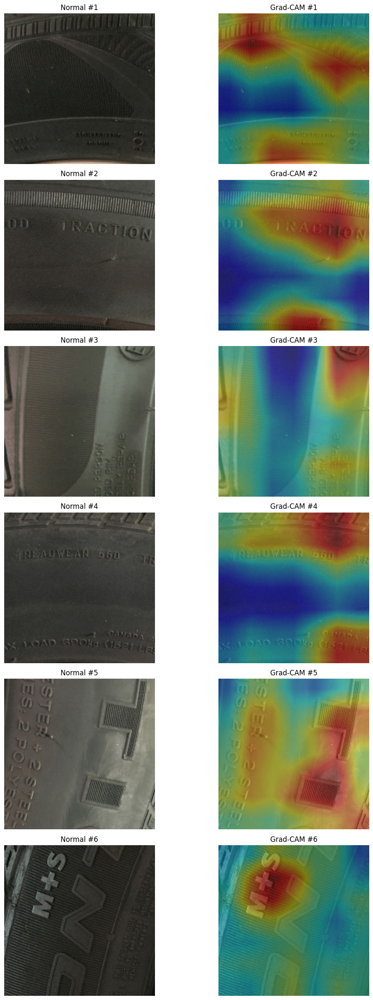

In [81]:
# @title
contador = 0

plt.figure(figsize=(12,24))

for images, labels in test_ds:

    for i in range(len(labels)):

        if int(labels[i]) == 1:

            original, gradcam = mostrar_gradcam(
                images[i]
            )

            plt.subplot(
                6,
                2,
                contador*2 + 1
            )

            plt.imshow(original)

            plt.title(
                f"Normal #{contador+1}"
            )

            plt.axis("off")

            plt.subplot(
                6,
                2,
                contador*2 + 2
            )

            plt.imshow(gradcam)

            plt.title(
                f"Grad-CAM #{contador+1}"
            )

            plt.axis("off")

            contador += 1

            if contador == 6:

                break

    if contador == 6:

        break

plt.tight_layout()

plt.show()

**Análisis del Desbalance de Clases**

**Cuantificar el desbalance del dataset**

Clase 0 (Cracked): 210
Clase 1 (Normal): 115


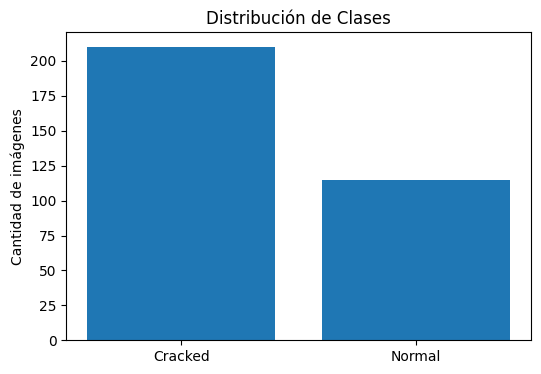

In [82]:
# @title
import numpy as np
import matplotlib.pyplot as plt

y_test = np.concatenate(
    [y for x, y in test_ds],
    axis=0
)

clase_0 = np.sum(y_test == 0)
clase_1 = np.sum(y_test == 1)

print("Clase 0 (Cracked):", clase_0)
print("Clase 1 (Normal):", clase_1)

plt.figure(figsize=(6,4))

plt.bar(
    ["Cracked","Normal"],
    [clase_0, clase_1]
)

plt.title(
    "Distribución de Clases"
)

plt.ylabel("Cantidad de imágenes")

plt.show()

**Calcular porcentaje de desbalance**

In [84]:
# @title
total = clase_0 + clase_1

pct_0 = clase_0 / total * 100
pct_1 = clase_1 / total * 100

print(
    f"Cracked: {pct_0:.2f}%"
)

print(
    f"Normal: {pct_1:.2f}%"
)

Cracked: 64.62%
Normal: 35.38%


**Calcular pesos de clase**

In [85]:
# @title
from sklearn.utils.class_weight import compute_class_weight

y_train = np.concatenate(
    [y for x, y in train_ds],
    axis=0
)

class_weights = compute_class_weight(

    class_weight="balanced",

    classes=np.unique(y_train),

    y=y_train.flatten()

)

class_weights = {

    0: class_weights[0],

    1: class_weights[1]

}

print(class_weights)

{0: np.float64(1.0692567567567568), 1: np.float64(0.9391691394658753)}


**Entrenar ResNet50 usando Class Weights**

In [86]:
# @title
history_balanced = transfer_model.fit(

    train_ds,

    validation_data=val_ds,

    epochs=10,

    class_weight=class_weights,

    callbacks=[
        early_stop,
        reduce_lr
    ]

)

Epoch 1/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 20s 682ms/step - accuracy: 0.9731 - loss: 0.0820 - val_accuracy: 0.9286 - val_loss: 0.1583 - learning_rate: 1.0000e-04
Epoch 2/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 14s 682ms/step - accuracy: 0.9731 - loss: 0.0914 - val_accuracy: 0.9286 - val_loss: 0.1524 - learning_rate: 1.0000e-04
Epoch 3/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 14s 687ms/step - accuracy: 0.9652 - loss: 0.0851 - val_accuracy: 0.9286 - val_loss: 0.1553 - learning_rate: 1.0000e-04
Epoch 4/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 13s 633ms/step - accuracy: 0.9716 - loss: 0.0733 - val_accuracy: 0.9429 - val_loss: 0.1506 - learning_rate: 1.0000e-04
Epoch 5/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 22s 697ms/step - accuracy: 0.9810 - loss: 0.0700 - val_accuracy: 0.9286 - val_loss: 0.1512 - learning_rate: 1.0000e-04
Epoch 6/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 17s 545ms/step - accuracy: 0.9779 - loss: 0.0700 - val_accuracy: 0.9429 - val_loss: 0.1478 - learning_rate: 1.0000e-04
Epoch 7/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 512ms/step - acc

**Evaluación del modelo balanceado**

In [87]:
# @title
loss_balanced, acc_balanced = transfer_model.evaluate(
    test_ds
)

print(
    "Accuracy:",
    round(acc_balanced*100,2),
    "%"
)

print(
    "Loss:",
    round(loss_balanced,4)
)

11/11 ━━━━━━━━━━━━━━━━━━━━ 8s 717ms/step - accuracy: 0.8154 - loss: 0.3880
Accuracy: 81.54 %
Loss: 0.388


**Comparación antes vs después**

In [88]:
# @title
import pandas as pd

comparacion_balance = pd.DataFrame({

    "Modelo":[
        "ResNet50 Original",
        "ResNet50 + Class Weights"
    ],

    "Accuracy (%)":[
        round(test_accuracy*100,2),
        round(acc_balanced*100,2)
    ]

})

comparacion_balance

,Modelo,Accuracy (%)
0,ResNet50 Original,80.00
1,ResNet50 + Class Weights,81.54


**Gráfico comparativo**

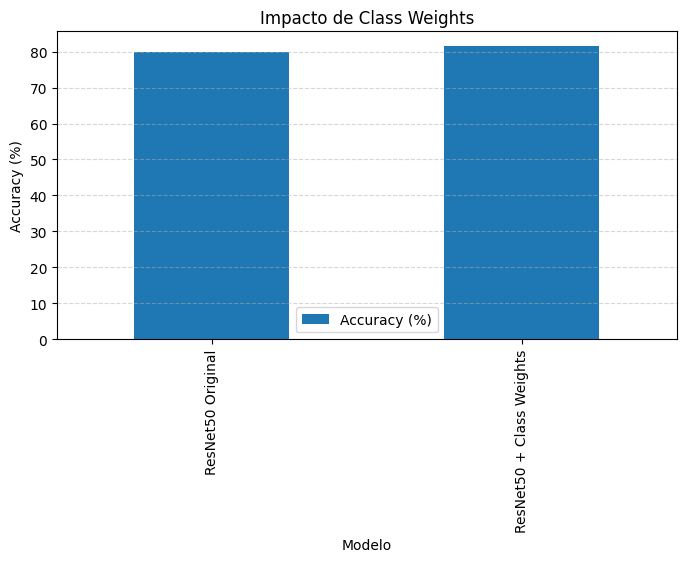

In [89]:
# @title
comparacion_balance.plot(

    x="Modelo",

    y="Accuracy (%)",

    kind="bar",

    figsize=(8,4)

)

plt.title(
    "Impacto de Class Weights"
)

plt.ylabel(
    "Accuracy (%)"
)

plt.grid(
    axis="y",
    linestyle="--",
    alpha=0.5
)

plt.show()

**Análisis cualitativo de fallos:** identificar y comentar al menos cinco ejemplos mal
clasificados, proponiendo hipótesis sobre sus causas.

In [90]:
# @title
import numpy as np

imagenes_error = []
labels_reales = []
labels_predichas = []
probabilidades = []

for images, labels in test_ds:

    preds = transfer_model.predict(
        images,
        verbose=0
    )

    preds_bin = (
        preds > 0.5
    ).astype(int)

    for i in range(len(images)):

        real = int(labels[i])

        pred = int(preds_bin[i])

        if real != pred:

            imagenes_error.append(
                images[i].numpy().astype("uint8")
            )

            labels_reales.append(real)

            labels_predichas.append(pred)

            probabilidades.append(
                float(preds[i])
            )

print(
    "Errores encontrados:",
    len(imagenes_error)
)

/tmp/ipykernel_1571/2819349460.py:23: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  pred = int(preds_bin[i])
/tmp/ipykernel_1571/2819349460.py:36: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  float(preds[i])


Errores encontrados: 60


**Mostrar cinco errores**

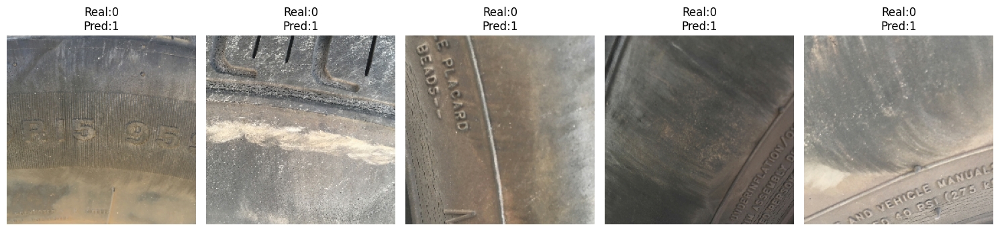

In [91]:
# @title
import matplotlib.pyplot as plt

n = min(
    5,
    len(imagenes_error)
)

plt.figure(figsize=(15,8))

for i in range(n):

    plt.subplot(1,5,i+1)

    plt.imshow(
        imagenes_error[i]
    )

    plt.title(
        f"Real:{labels_reales[i]}\nPred:{labels_predichas[i]}"
    )

    plt.axis("off")

plt.tight_layout()

plt.show()

**Mostrar probabilidades**

In [92]:
# @title
for i in range(min(5, len(imagenes_error))):

    print(
        f"Ejemplo {i+1}"
    )

    print(
        f"Clase real: {labels_reales[i]}"
    )

    print(
        f"Clase predicha: {labels_predichas[i]}"
    )

    print(
        f"Probabilidad: {probabilidades[i]:.4f}"
    )

    print("-"*40)

Ejemplo 1
Clase real: 0
Clase predicha: 1
Probabilidad: 0.9209
----------------------------------------
Ejemplo 2
Clase real: 0
Clase predicha: 1
Probabilidad: 0.7909
----------------------------------------
Ejemplo 3
Clase real: 0
Clase predicha: 1
Probabilidad: 0.6689
----------------------------------------
Ejemplo 4
Clase real: 0
Clase predicha: 1
Probabilidad: 0.5272
----------------------------------------
Ejemplo 5
Clase real: 0
Clase predicha: 1
Probabilidad: 0.8026
----------------------------------------
